In [1]:
import pickle
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
from scipy.special import softmax
from matplotlib.patches import Wedge
from scipy.stats import mode
from sklearn.metrics import confusion_matrix

### 0. Helper Function

In [2]:
def load_results(pickle_path, session):
    results = pickle.load(open(f"{pickle_path}/{session}_results.pickle", "rb"))
    trial_chans = results['test_trial_chans']
    trials = []
    channels = []
    for i, trial_chan in enumerate(trial_chans):
        #separate by "_", last 1 is channel index, last 2 is trial index
        trial_idx = int(trial_chan.split("_")[-2])
        channel_idx = int(trial_chan.split("_")[-1])
        trials.append(trial_idx)
        channels.append(channel_idx)
    # reorder trial_chans to separate trial indices and channel indices
    logits = results['test_logits']
    labels = results['test_labels']
    acc = results['test_acc']
    trials = np.array(trials)
    channels = np.array(channels)
    assert len(trials) == len(channels) == len(logits) == len(labels)
    return logits, labels, trials, channels, acc

In [3]:
def vis_pie_chart_simple(logits, labels_tf, labels_sf, labels, trial_idx, channel_idx, mode, acc):
    print("drawing pie chart...")
    
    region_colors = {
        "Visual Cortex": "red",
        "CA1": "orange", 
        "CA2": "green",
        "CA3": "blue",
        "DG": "magenta"
    }
    regions = list(region_colors.keys())
    
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(60, 112))  # Adjusted figsize for better resolution
    pie_size = 0.4  # Increase pie size for better visibility

    ### layout parameters
    shank_offset = 15  # Reduced from trial_length + 10 since we'll be using actual trials
    num_shanks = 8
    channels_per_shank = 128

    # Get unique trials and create a mapping from trial number to position
    unique_trials = sorted(set(trial_idx))
    trial_to_pos = {trial: pos for pos, trial in enumerate(unique_trials)}

    for idx, (logit, label, label_tf, label_sf, trial, channel) in tqdm(enumerate(zip(logits, labels, labels_tf, labels_sf, trial_idx, channel_idx)), total=len(logits), desc="Processing"):
        probabilities = softmax(logit)
        angles = probabilities * 360
        start_angle = 0

        ## position
        shank_idx = channel // channels_per_shank
        channel_in_shank = channel % channels_per_shank
        # Use trial_to_pos mapping to get the x coordinate
        x_coord = trial_to_pos[trial] + shank_idx * shank_offset
        y_coord = channel_in_shank
        ##

        for region_idx, (region, angle) in enumerate(zip(regions, angles)):
            if angle > 0:
                wedge = Wedge((x_coord, y_coord), pie_size, start_angle, 
                            start_angle + angle, facecolor=region_colors[region],
                            alpha=0.8, linewidth=0)
                ax1.add_patch(wedge)
                start_angle += angle
        
        # Add a circle for the label
        circle = plt.Circle((x_coord, y_coord), pie_size, color=region_colors[regions[label_tf]], alpha=0.8)
        ax2.add_patch(circle)

        circle = plt.Circle((x_coord, y_coord), pie_size, color=region_colors[regions[label_sf]], alpha=0.8)
        ax3.add_patch(circle)

        circle = plt.Circle((x_coord, y_coord), pie_size, color=region_colors[regions[label]], alpha=0.8)
        ax4.add_patch(circle)

    x_max = shank_offset * num_shanks
    y_max = channels_per_shank
    ax1.set_xlim(-1, x_max)
    ax1.set_ylim(-1, y_max)
    ax1.set_xlabel("Trial Index", fontsize=14)
    ax1.set_ylabel("Channel Index", fontsize=14)

    ax2.set_xlim(-1, x_max)
    ax2.set_ylim(-1, y_max)
    ax2.set_xlabel("Trial Index", fontsize=14)
    ax2.set_ylabel("Channel Index", fontsize=14)
    ax2.set_title(f"channels after temporal smoothing", fontsize=16)

    ax3.set_xlim(-1, x_max)
    ax3.set_ylim(-1, y_max)
    ax3.set_xlabel("Trial Index", fontsize=14)
    ax3.set_ylabel("Channel Index", fontsize=14)
    ax3.set_title(f"channels after spatial smoothing", fontsize=16)

    ax4.set_xlim(-1, x_max)
    ax4.set_ylim(-1, y_max)
    ax4.set_xlabel("Trial Index", fontsize=14)
    ax4.set_ylabel("Channel Index", fontsize=14)
    ax4.set_title(f"ground truth", fontsize=16)

    # Add shank labels
    for shank in range(num_shanks):
        shank_start = shank * shank_offset
        shank_end = shank_start + len(unique_trials)
        ax1.text((shank_start + shank_end) / 2, y_max + 5, f"Shank {shank + 1}", ha='center', fontsize=12)
        ax2.text((shank_start + shank_end) / 2, y_max + 5, f"Shank {shank + 1}", ha='center', fontsize=12)
        ax3.text((shank_start + shank_end) / 2, y_max + 5, f"Shank {shank + 1}", ha='center', fontsize=12)
        ax4.text((shank_start + shank_end) / 2, y_max + 5, f"Shank {shank + 1}", ha='center', fontsize=12)

    # Set x-ticks for actual trials for each shank
    trial_ticks = []
    trial_labels = []
    for shank in range(num_shanks):
        for pos, trial in enumerate(unique_trials):
            trial_ticks.append(pos + shank * shank_offset)
            trial_labels.append(str(trial))
    
    ax1.set_xticks(trial_ticks)
    ax1.set_xticklabels(trial_labels, rotation=45)
    ax2.set_xticks(trial_ticks)
    ax2.set_xticklabels(trial_labels, rotation=45)
    ax3.set_xticks(trial_ticks)
    ax3.set_xticklabels(trial_labels, rotation=45)
    ax4.set_xticks(trial_ticks)
    ax4.set_xticklabels(trial_labels, rotation=45)
    # title: test accuracy
    # plt.suptitle(f"acc: {acc}", fontsize=16)
    plt.tight_layout()
    plt.show()

In [19]:
data_mode = 'ibl'

if data_mode == 'Neuronexus':
    # walk_dir = '/scratch/th3129/region_decoding/results/Neuronexus/spectrogram_preprocessed/wave2vec2/across_session/'
    walk_dir = '/scratch/mkp6112/LFP/region_decoding/results/Neuronexus/spectrogram/wave2vec2/across_session/'
    sessions = ['AD_HF01_1', 'AD_HF02_2', 'AD_HF02_4', 'AD_HF03_1', 'AD_HF03_2', 'NN_syn_01', 'NN_syn_02']
    label_json = {'0': 'Cortex', '1': 'CA1', '2': 'CA2', '3': 'CA3', '4': 'DG'}

elif data_mode == 'Allen':
    walk_dir = '/scratch/mkp6112/LFP/region_decoding/results/Allen/spectrogram/wave2vec2/across_session/'
    sessions = ['719161530', '794812542', '778998620', '798911424', '771990200', '771160300', '768515987']
    label_json = {'0': 'CA1', '1': 'CA2', '2': 'CA3', '3': 'DG', '4': 'Cortex'}

elif data_mode == 'ibl':
    walk_dir = '/scratch/mkp6112/LFP/region_decoding/results/ibl/spectrogram/wave2vec2/across_session/'
    sessions = ['0802ced5-33a3-405e-8336-b65ebc5cb07c_probe00','0802ced5-33a3-405e-8336-b65ebc5cb07c_probe01',
                '0a018f12-ee06-4b11-97aa-bbbff5448e9f_probe00','3638d102-e8b6-4230-8742-e548cd87a949_probe01',
                '5dcee0eb-b34d-4652-acc3-d10afc6eae68_probe00','d2832a38-27f6-452d-91d6-af72d794136c_probe00',
                '54238fd6-d2d0-4408-b1a9-d19d24fd29ce_probe00']

In [20]:
results = {}
per_class_accuracies = {}
conf_matrices = {}
brain_regions = ['CA1', 'CA2', 'CA3', 'DG', 'Cortex']

for session in sessions:
    logits, labels, trials, channels, acc = load_results(walk_dir, session)
    pred = np.argmax(logits, axis=1)
    results[session] = np.mean(pred == labels)

    class_acc = {}
    for cls in np.unique(labels):
        cls_mask = labels == cls
        correct = np.sum(pred[cls_mask] == labels[cls_mask])
        total = np.sum(cls_mask)
        class_acc[int(cls)] = correct / total if total > 0 else float('nan')

    per_class_accuracies[session] = class_acc

    cm = confusion_matrix(labels, pred, labels=range(len(brain_regions)))
    conf_matrices[session] = cm

In [21]:
per_class_accuracies

{'0802ced5-33a3-405e-8336-b65ebc5cb07c_probe00': {0: 0.5847701149425287,
  2: 0.044444444444444446,
  3: 0.9338235294117647,
  4: 1.0},
 '0802ced5-33a3-405e-8336-b65ebc5cb07c_probe01': {0: 0.86,
  3: 0.6202380952380953,
  4: 0.77734375},
 '0a018f12-ee06-4b11-97aa-bbbff5448e9f_probe00': {0: 0.9776785714285714,
  3: 0.6776960784313726,
  4: 0.8},
 '3638d102-e8b6-4230-8742-e548cd87a949_probe01': {0: 0.92,
  3: 0.8135964912280702,
  4: 0.7708333333333334},
 '5dcee0eb-b34d-4652-acc3-d10afc6eae68_probe00': {0: 0.4382183908045977,
  3: 0.6574074074074074,
  4: 1.0},
 'd2832a38-27f6-452d-91d6-af72d794136c_probe00': {0: 0.532051282051282,
  2: 0.06666666666666667,
  3: 0.7557471264367817,
  4: 1.0},
 '54238fd6-d2d0-4408-b1a9-d19d24fd29ce_probe00': {0: 0.6857638888888888,
  2: 0.0,
  3: 0.6527777777777778,
  4: 1.0}}

In [22]:
import seaborn as sns

def plot_confusion_matrix(cm, class_labels, title='Confusion Matrix'):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)

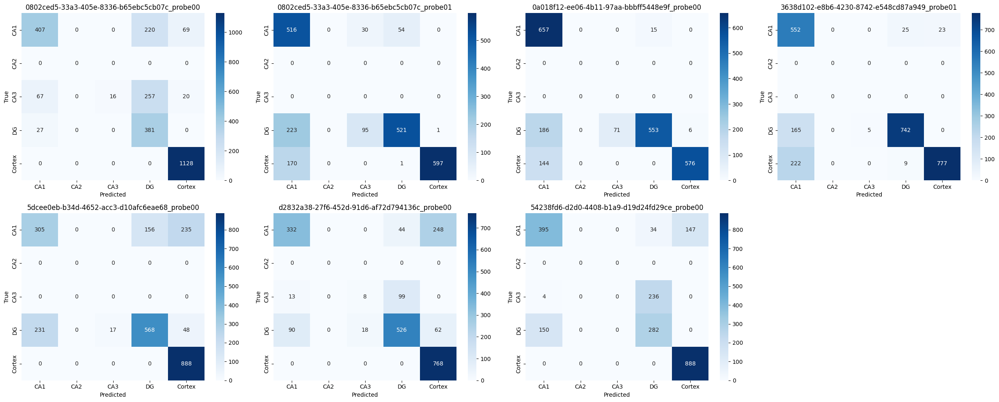

In [23]:
cnt = 1
plt.figure(figsize=(25, 10))

for session in sessions:
    plt.subplot(2, 4, cnt)
    plot_confusion_matrix(conf_matrices[session], class_labels=brain_regions, title=session)
    cnt += 1

plt.tight_layout()
plt.show()

/state/partition1/job-59893235/ipykernel_782239/2347233330.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=brain_regions, widths=0.3)


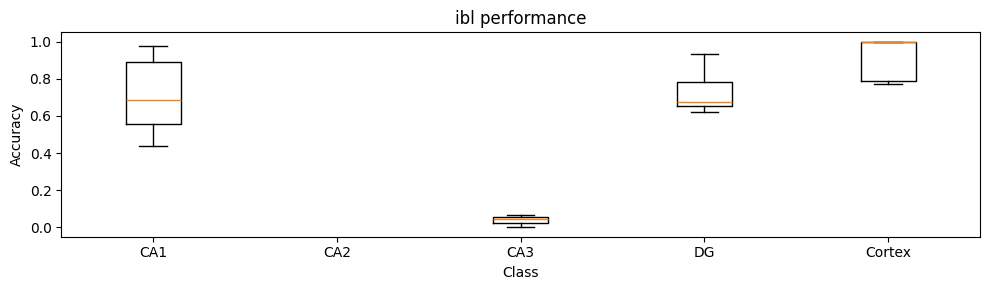

In [29]:
class_acc_by_class = {}

for session, class_accs in per_class_accuracies.items():
    for cls, acc in class_accs.items():
        if cls not in class_acc_by_class:
            class_acc_by_class[cls] = []
        class_acc_by_class[cls].append(acc)

for i in range(len(brain_regions)):
    if i not in class_acc_by_class.keys():
        class_acc_by_class[i] = [np.nan]
        
sorted_classes = sorted(class_acc_by_class.keys())
data = [class_acc_by_class[cls] for cls in sorted_classes]

plt.figure(figsize=(10, 3))
plt.boxplot(data, labels=brain_regions, widths=0.3)
plt.xlabel('Class')
plt.ylabel('Accuracy')
plt.title(f'{data_mode} performance')
plt.tight_layout()
plt.show()

### 1. Spatial & Temporal Post processing

In [ ]:
pickle_path = f'/scratch/th3129/region_decoding/results/Neuronexus/spectrogram_preprocessed/wave2vec2/across_session/'
session = 'NN_syn_01'

logits, labels, trials, channels, acc = load_results(pickle_path, session)

In [13]:
unique_channels = np.unique(channels)
predicted_labels = np.zeros_like(labels)
class_weights = [1,1,5,2,1]

for ch in unique_channels:
    logits_of_interest = logits[channels == ch]

    # average logits from all trials of same channel with weights, to get the max logits
    average_logits = np.mean(logits_of_interest, axis=0)
    weighted_average_logits = average_logits * class_weights
    majority_vote = np.argmax(weighted_average_logits)
    
    # predicted_labels_of_interest = np.argmax(logits_of_interest, axis=1)
    # majority_vote = mode(predicted_labels_of_interest)[0].flatten()
    predicted_labels[channels == ch] = majority_vote

In [14]:
def spatial_filter(grid, coords, window=2, channels_per_shank=127):
    filtered_pred = np.full(len(coords), -1)
    
    for i in tqdm(range(len(coords))):
        r, c = coords[i]
    
        values = []
        for dr in np.arange(-window, window+1):
            rr = r + dr
            if 0 <= rr < channels_per_shank:
                val = grid[rr, c]
                if val != -1:
                    values.append(val)

        filtered_pred[i] = mode(values)[0] if values else -1

    return filtered_pred

In [15]:
# convert predicted_labels to grid structure, and prepare coords to apply spatial filter
channels_per_shank = 128
n_shanks = 8

shank_idx = channels // channels_per_shank
channel_in_shank = channels % channels_per_shank

grid = np.full((channels_per_shank, n_shanks), fill_value=-1)
grid[channel_in_shank, shank_idx] = predicted_labels

channel_indices = channel_in_shank[trials == 0]
shank_indices = shank_idx[trials==0]
coords = np.array([channel_indices, shank_indices]).T
filtered_grid = spatial_filter(grid, coords)

100%|██████████| 555/555 [00:00<00:00, 3565.69it/s]


In [16]:
# convert 2d filtered_grid to 1d prediction 
filtered_predicted_labels = np.full_like(predicted_labels, -1)
unique_trials = np.unique(trials)

for t in unique_trials:
    filtered_predicted_labels[trials == t] = filtered_grid

In [17]:
def add_bar_labels(ax):
    for bar in ax.patches:
        height = bar.get_height()
        if height > 0:
            ax.annotate(f'{int(height)}',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # offset above bar
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=8)

accuracy: 0.716066066066066
accuracy after temporal process: 0.7927927927927928
accuracy after spatial process: 0.836036036036036


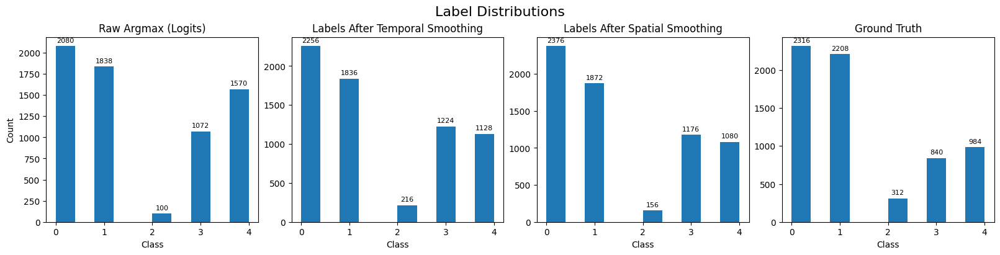

In [18]:
temporal_acc = np.sum(predicted_labels == labels)/len(labels)
spatial_acc = np.sum(filtered_predicted_labels == labels)/len(labels)

print(f"accuracy: {acc}")
print(f"accuracy after temporal process: {temporal_acc}")
print(f"accuracy after spatial process: {spatial_acc}")

fig, axes = plt.subplots(1, 4, figsize=(16, 4), constrained_layout=True)

axes[0].hist(np.argmax(logits, axis=1))
axes[0].set_title("Raw Argmax (Logits)")
axes[0].set_xlabel("Class")
axes[0].set_ylabel("Count")
add_bar_labels(axes[0])

axes[1].hist(predicted_labels)
axes[1].set_title("Labels After Temporal Smoothing")
axes[1].set_xlabel("Class")
add_bar_labels(axes[1])

axes[2].hist(filtered_predicted_labels)
axes[2].set_title("Labels After Spatial Smoothing")
axes[2].set_xlabel("Class")
add_bar_labels(axes[2])

axes[3].hist(labels)
axes[3].set_title("Ground Truth")
axes[3].set_xlabel("Class")
add_bar_labels(axes[3])

plt.suptitle("Label Distributions", fontsize=16)
plt.show()


In [19]:
vis_pie_chart_simple(logits, predicted_labels, filtered_predicted_labels, labels, trials, channels, "test", acc)

drawing pie chart...


Processing: 100%|██████████| 6660/6660 [01:57<00:00, 56.86it/s]


### 2. Sharp Wave Ripple Analysis

In [31]:
pickle_path = f'/scratch/th3129/region_decoding/results/Neuronexus/spectrogram_preprocessed/wave2vec2/across_session/'
session = 'NN_syn_01'

logits, labels, trials, channels, acc = load_results(pickle_path, session)
results = pickle.load(open(f"{pickle_path}/{session}_results.pickle", "rb"))

In [5]:
from scipy.io import loadmat

ripple_path = '/scratch/th3129/shared/Neuronexus_dataset/NN_syn_20230601/NN_syn_20230601.ripples.events.mat'
data = loadmat(ripple_path)

In [6]:
ripple_events = data['ripples'][0][0][0]
event_times = ripple_events[(ripple_events[:, 0] > 2160) & (ripple_events[:, 0] < 2160+300)][:, 0]

In [16]:
trial_length = 3
swr_trial_numbers = (event_times - 2160) // trial_length

In [17]:
np.unique(swr_trial_numbers)

array([ 0.,  1.,  7.,  8.,  9., 11., 13., 25., 31., 32., 33., 35., 48.,
       49., 54., 58., 59., 61., 62., 64., 65., 66., 74., 76., 78., 79.,
       84., 85., 87., 88., 89., 91., 93., 94., 98., 99.])

In [20]:
test_trials = np.unique(trials)
swr_trials = np.array([t for t in test_trials if t in np.unique(swr_trial_numbers)])

In [45]:
acc_per_trial

[0.7153153153153153,
 0.8306306306306306,
 0.745945945945946,
 0.6918918918918919,
 0.7693693693693694,
 0.6342342342342342,
 0.6360360360360361,
 0.6954954954954955,
 0.7567567567567568,
 0.7207207207207207,
 0.7549549549549549,
 0.6414414414414414]

In [54]:
swr_acc = np.array(acc_per_trial)[np.isin(test_trials, swr_trials)]
non_swr_acc = np.array(acc_per_trial)[~np.isin(test_trials, swr_trials)]

print("Sharp Wave Ripple accuracy: ", np.mean(swr_acc))
print("Non Sharp Wave Ripple accuracy: ", np.mean(non_swr_acc))

Sharp Wave Ripple accuracy:  0.7376576576576577
Non Sharp Wave Ripple accuracy:  0.7006435006435006


In [57]:
from scipy.stats import ttest_ind

stat, p = ttest_ind(swr_acc, non_swr_acc, alternative='greater')
print(stat, p)

1.0575194495616607 0.15757581897181258


In [32]:
acc_per_trial = []

for t in test_trials:
    selected_logits = logits[trials == t]
    selected_labels = labels[trials == t]
    predicted_labels = np.argmax(selected_logits, axis=1)
    acc = np.sum(predicted_labels == selected_labels)/len(selected_labels)
    acc_per_trial.append(acc)

In [69]:
num_classes = 5
acc_per_trial_per_class = []

for t in test_trials:
    selected_logits = logits[trials == t]
    selected_labels = labels[trials == t]
    predicted_labels = np.argmax(selected_logits, axis=1)

    class_acc = np.full(num_classes, np.nan)  # initialize with NaNs
    for cls in range(num_classes):
        cls_mask = selected_labels == cls
        if np.any(cls_mask):
            cls_acc = np.mean(predicted_labels[cls_mask] == selected_labels[cls_mask])
            class_acc[cls] = cls_acc

    acc_per_trial_per_class.append(class_acc)

acc_per_trial_per_class = np.vstack(acc_per_trial_per_class)

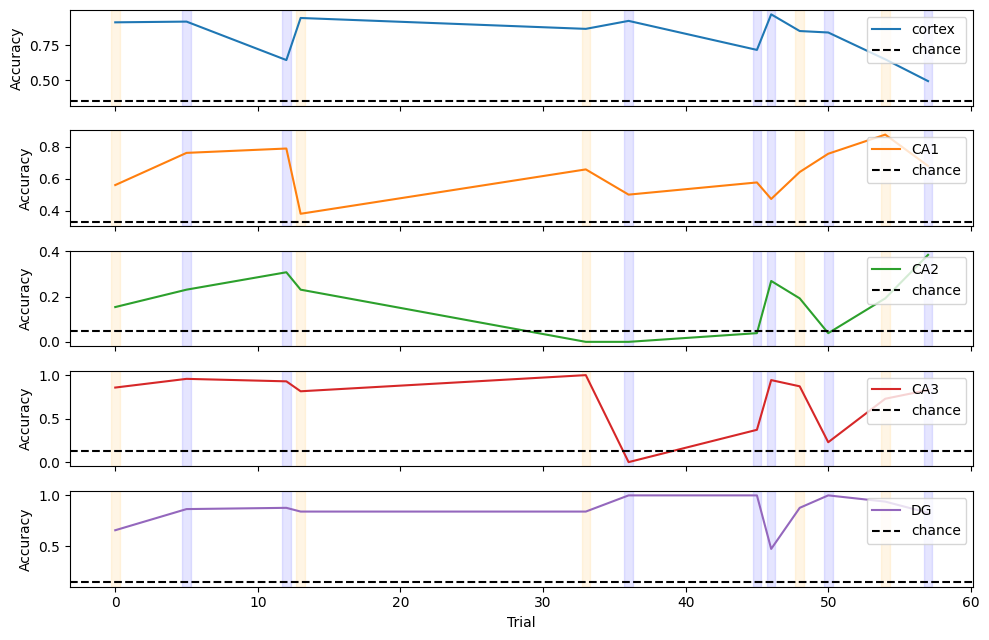

In [90]:
fig, axs = plt.subplots(num_classes, 1, figsize=(10, 1.3 * num_classes), sharex=True)
class_counts = np.bincount(labels, minlength=num_classes)
class_probs = class_counts / np.sum(class_counts)
brain_regions = ['cortex', 'CA1', 'CA2', 'CA3', 'DG']

for i in range(num_classes):
    axs[i].plot(test_trials, acc_per_trial_per_class[:, i], label=brain_regions[i], color=f'C{i}')

    
    for trial in test_trials:
        start = trial - 0.3
        end = trial + 0.3
        if trial in swr_trials:
            axs[i].axvspan(start, end, color='orange', alpha=0.1)
        else:
            axs[i].axvspan(start, end, color='blue', alpha=0.1)

    axs[i].axhline(class_probs[i], color='black', linestyle='--', label='chance')
    axs[i].set_ylabel('Accuracy')
    axs[i].legend(loc='upper right')

axs[-1].set_xlabel('Trial')
plt.tight_layout()
plt.show()

In [26]:
import os
import pandas as pd
import seaborn as ana

file_path_raw = "/scratch/th3129/region_decoding/data/Neuronexus/raw/"
source_session = 'AD_HF01_1'

file_path = os.path.join(file_path_raw, f"{source_session}_data.pickle")

In [8]:
with open(file_path, 'rb') as f:
    data = pickle.load(f)

In [19]:
mtx = []

for j in range(len(data)):
    [base_rms_mini, pow_whole_mini,pow_delta_mini,pow_theta_mini, pow_alpha_mini, pow_beta_mini, pow_gamma_mini, rms_whole_mini,
    rms_delta_mini, rms_theta_mini, rms_alpha_mini, rms_beta_mini, rms_gamma_mini], label, count, i = data[j]
    mtx.append([base_rms_mini, pow_whole_mini,pow_delta_mini,pow_theta_mini, pow_alpha_mini, pow_beta_mini, pow_gamma_mini, rms_whole_mini,
    rms_delta_mini, rms_theta_mini, rms_alpha_mini, rms_beta_mini, rms_gamma_mini, label, count, i])

mtx = np.array(mtx)

In [27]:
columns = ['RMS', 'Power (Whole)', 'Power (Delta)', 'Power (Theta)', 'Power (Alpha)', 'Power (Beta)', 'Power (Gamma)',
           'RMS (Whole)', 'RMS (Delta)', 'RMS (Theta)', 'RMS (Alpha)', 'RMS (Beta)', 'RMS (Gamma)', 'Region', 'Count', 'Index']

df = pd.DataFrame(mtx, columns=columns)

# Convert relevant columns to float
feature_cols = columns[:13]
for col in feature_cols:
    df[col] = df[col].astype(float)

# Pivot for heatmap: average feature values per region, then normalize across rows (z-score)
grouped = df.groupby("Region")[feature_cols].mean()
grouped_normalized = (grouped - grouped.mean(axis=1).values[:, None]) / grouped.std(axis=1).values[:, None]

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(grouped_normalized, cmap="RdBu_r", center=0)
plt.title("Region-wise Normalized Feature Heatmap")
plt.ylabel("Regions")
plt.xlabel("Metrics")
plt.tight_layout()
plt.show()

NameError: name 'sns' is not defined

<Figure size 1000x800 with 0 Axes>

In [12]:
[base_rms_mini, pow_whole_mini,pow_delta_mini,pow_theta_mini, pow_alpha_mini, pow_beta_mini, pow_gamma_mini, rms_whole_mini,
rms_delta_mini, rms_theta_mini, rms_alpha_mini, rms_beta_mini, rms_gamma_mini], label, count, i = data[0]